In [2]:
import json
import io
import random
from pathlib import Path

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

from dataset import LSMDataset, collate_fn

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}")

Device: cpu


In [4]:
from dataset import make_splits
from augmentations import build_train_augments

aug = build_train_augments()

In [5]:
train_ids_s, val_ids_s, test_ids_s = make_splits(
    "../corpus_LSM_esp/lsm_dataset.parquet",
    strategy="stratified",
    seed=42,
)

train_ds_s = LSMDataset("../corpus_LSM_esp/lsm_dataset.parquet", video_ids=train_ids_s)
val_ds_s   = LSMDataset("../corpus_LSM_esp/lsm_dataset.parquet", video_ids=val_ids_s)

train_loader_s = DataLoader(train_ds_s, batch_size=32, shuffle=True,  collate_fn=collate_fn)
val_loader_s   = DataLoader(val_ds_s,   batch_size=32, shuffle=False, collate_fn=collate_fn)

print(f"Train: {len(train_ds_s)} | Val: {len(val_ds_s)} | Test: {len(test_ids_s)}")


───────────────────────────────────────────────────────
Split: stratified
───────────────────────────────────────────────────────
  Total  : 2447
  Train  :  1643  (67.1%)
  Val    :   402  (16.4%)
  Test   :   402  (16.4%)

  ✓  Sin overlaps de video_id entre splits

  Clases en train : 249
  Clases en val   : 249
  Clases en test  : 249

  Señadores en train : ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11']
  Señadores en val   : ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11']
  Señadores en test  : ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11']
  ⚠  Señadores compartidos entre splits: {'11', '01', '05', '04', '07', '10', '09', '02', '06', '03', '08'}
───────────────────────────────────────────────────────
LSMDataset cargado: 1643 muestras | 249 clases | normalize=True | augment=off
LSMDataset cargado: 402 muestras | 249 clases | normalize=True | augment=off
Train: 1643 | Val: 402 | Test: 402


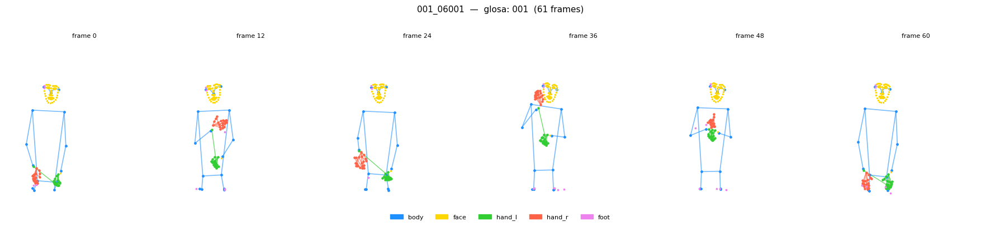

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import io
import numpy as np
import pandas as pd

# ── Índices de regiones ───────────────────────────────────────
REGIONS = {
    "body":   (list(range(0,  17)),  "dodgerblue",   6),
    "face":   (list(range(25, 92)),  "gold",         2),
    "hand_l": (list(range(92, 113)), "limegreen",    5),
    "hand_r": (list(range(113,132)), "tomato",       5),
    "foot":   (list(range(17, 25)),  "violet",       3),
}

# Conexiones del cuerpo (COCO 17 keypoints)
BODY_CONNECTIONS = [
    (0,1),(0,2),(1,3),(2,4),(5,6),(5,7),(7,9),(6,8),(8,10),
    (5,11),(6,12),(11,12),(11,13),(13,15),(12,14),(14,16),
]
HAND_CONNECTIONS = [
    (0,1),(1,2),(2,3),(3,4),
    (0,5),(5,6),(6,7),(7,8),
    (0,9),(9,10),(10,11),(11,12),
    (0,13),(13,14),(14,15),(15,16),
    (0,17),(17,18),(18,19),(19,20),
]


def plot_sign_frames(video_id, parquet_path, n_frames=6, figsize=(18, 4)):
    """
    Muestra n_frames distribuidos uniformemente a lo largo de la seña.
    """
    df  = pd.read_parquet(parquet_path, columns=["video_id","keypoints","width","height","glosa"])
    row = df[df["video_id"] == video_id].iloc[0]

    kpts = np.load(io.BytesIO(row["keypoints"]))  # (T, 133, 3)
    T    = kpts.shape[0]
    w, h = float(row["width"]), float(row["height"])

    # Normalizar
    kpts[:, :, 0] /= w
    kpts[:, :, 1] /= h

    frame_indices = np.linspace(0, T - 1, n_frames, dtype=int)

    fig, axes = plt.subplots(1, n_frames, figsize=figsize)
    if n_frames == 1:
        axes = [axes]

    for ax, fi in zip(axes, frame_indices):
        frame = kpts[fi]  # (133, 3)
        x, y  = frame[:, 0], frame[:, 1]

        # Dibujar conexiones del cuerpo
        for s, e in BODY_CONNECTIONS:
            ax.plot([x[s], x[e]], [y[s], y[e]], color="dodgerblue", lw=1.2, alpha=0.6)

        # Conexiones manos
        HAND_CONNECTIONS_L = [(s + 92,  e + 92)  for s, e in HAND_CONNECTIONS if s + 92  < 133 and e + 92  < 133]
        HAND_CONNECTIONS_R = [(s + 113, e + 113) for s, e in HAND_CONNECTIONS if s + 113 < 133 and e + 113 < 133]
        
        for s, e in HAND_CONNECTIONS_L:
            ax.plot([x[s], x[e]], [y[s], y[e]], color="limegreen", lw=1, alpha=0.7)
        for s, e in HAND_CONNECTIONS_R:
            ax.plot([x[s], x[e]], [y[s], y[e]], color="tomato", lw=1, alpha=0.7)

        # Puntos por región
        for region, (indices, color, size) in REGIONS.items():
            ax.scatter(x[indices], y[indices], c=color, s=size, zorder=3)

        ax.set_xlim(-0.05, 1.05)
        ax.set_ylim(1.05, -0.05)  # invertir Y (imagen)
        ax.set_aspect("equal")
        ax.axis("off")
        ax.set_title(f"frame {fi}", fontsize=8)

    # Leyenda
    legend = [mpatches.Patch(color=c, label=r)
              for r, (_, c, _) in REGIONS.items()]
    fig.legend(handles=legend, loc="lower center", ncol=5,
               fontsize=8, frameon=False)
    fig.suptitle(f"{video_id}  —  glosa: {row['glosa']}  ({T} frames)", fontsize=11)
    plt.tight_layout()
    plt.show()


# Ejemplo: ver la primera seña del split de train
plot_sign_frames(train_ids_s[0], "../corpus_LSM_esp/lsm_dataset.parquet", n_frames=6)

In [18]:
from augmentations import build_train_augments

def animate_sign_comparison(video_id, parquet_path, interval=80):
    """
    Muestra dos animaciones lado a lado:
    izquierda → original, derecha → augmentado
    """
    df  = pd.read_parquet(parquet_path, columns=["video_id","keypoints","width","height","glosa"])
    row = df[df["video_id"] == video_id].iloc[0]

    kpts = np.load(io.BytesIO(row["keypoints"]))   # (T, 133, 3)
    T    = kpts.shape[0]
    w, h = float(row["width"]), float(row["height"])
    kpts[:, :, 0] /= w
    kpts[:, :, 1] /= h

    # Original: solo x, y
    xy_orig = kpts[:, :, :2].copy()   # (T, 133, 2)

    # Augmentado: aplicar todas las augmentaciones
    aug    = build_train_augments()
    xy_aug = aug(xy_orig.copy())      # (T, 133, 2)  — T puede cambiar con SpeedPerturbation
    T_aug  = xy_aug.shape[0]

    # Conexiones con offset y filtro
    HAND_CONNECTIONS_L = [(s + 92,  e + 92)  for s, e in HAND_CONNECTIONS
                          if s + 92 < 133 and e + 92 < 133]
    HAND_CONNECTIONS_R = [(s + 113, e + 113) for s, e in HAND_CONNECTIONS
                          if s + 113 < 133 and e + 113 < 133]

    fig, axes = plt.subplots(1, 2, figsize=(10, 6))
    titles_txt = [
        axes[0].set_title(f"Original  ({T} frames)"),
        axes[1].set_title(f"Augmentado  ({T_aug} frames)"),
    ]
    for ax in axes:
        ax.set_xlim(-0.05, 1.05)
        ax.set_ylim(1.05, -0.05)
        ax.set_aspect("equal")
        ax.axis("off")

    fig.suptitle(f"{video_id}  —  glosa: {row['glosa']}", fontsize=11)

    # Inicializar artistas para cada panel
    def init_panel(ax):
        scatters = {r: ax.scatter([], [], c=c, s=s, zorder=3)
                    for r, (idx, c, s) in REGIONS.items()}
        b_lines  = [ax.plot([], [], color="dodgerblue", lw=1.2, alpha=0.6)[0]
                    for _ in BODY_CONNECTIONS]
        hl_lines = [ax.plot([], [], color="limegreen",  lw=1,   alpha=0.7)[0]
                    for _ in HAND_CONNECTIONS_L]
        hr_lines = [ax.plot([], [], color="tomato",     lw=1,   alpha=0.7)[0]
                    for _ in HAND_CONNECTIONS_R]
        return scatters, b_lines, hl_lines, hr_lines

    sc0, bl0, hl0, hr0 = init_panel(axes[0])
    sc1, bl1, hl1, hr1 = init_panel(axes[1])

    def draw_frame(xy, scatters, b_lines, hl_lines, hr_lines, fi):
        """Dibuja un frame sobre un panel."""
        fi_clip = min(fi, xy.shape[0] - 1)   # por si T_aug < T
        x, y = xy[fi_clip, :, 0], xy[fi_clip, :, 1]

        for region, (indices, _, _) in REGIONS.items():
            scatters[region].set_offsets(np.c_[x[indices], y[indices]])
        for line, (s, e) in zip(b_lines, BODY_CONNECTIONS):
            line.set_data([x[s], x[e]], [y[s], y[e]])
        for line, (s, e) in zip(hl_lines, HAND_CONNECTIONS_L):
            line.set_data([x[s], x[e]], [y[s], y[e]])
        for line, (s, e) in zip(hr_lines, HAND_CONNECTIONS_R):
            line.set_data([x[s], x[e]], [y[s], y[e]])

        return list(scatters.values()) + b_lines + hl_lines + hr_lines

    # Usar el mayor T como número de frames de la animación
    T_total = max(T, T_aug)

    def update(fi):
        artists  = draw_frame(xy_orig, sc0, bl0, hl0, hr0, fi)
        artists += draw_frame(xy_aug,  sc1, bl1, hl1, hr1, fi)
        titles_txt[0].set_text(f"Original  (frame {min(fi, T-1)}/{T-1})")
        titles_txt[1].set_text(f"Augmentado  (frame {min(fi, T_aug-1)}/{T_aug-1})")
        return artists + titles_txt

    anim = FuncAnimation(fig, update, frames=T_total, interval=interval, blit=True)
    plt.close()
    return HTML(anim.to_jshtml())


from IPython.display import display, HTML

for i in range(4):
    idx = random.randint(0, len(train_ids_s) - 1)
    anim_html = animate_sign_comparison(
        train_ids_s[idx],
        "../corpus_LSM_esp/lsm_dataset.parquet"
    )
    display(anim_html)

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("warcoder/mexican-sign-language-dataset")

print("Path to dataset files:", path)

/lustre/home/estudiante_27/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


100%|██████████| 3.46G/3.46G [01:33<00:00, 39.9MB/s]

Extracting files...


Path to dataset files: /lustre/home/estudiante_27/.cache/kagglehub/datasets/warcoder/mexican-sign-language-dataset/versions/1
